In [2]:
!pip install -q sahi
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.2 MB/s eta 0:00:0000:01


In [3]:
import os
import cv2
import random
import shutil
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO

from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualize_object_predictions

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
MODEL_PATH = "/kaggle/input/datasets/aadeeshranjan7/v11myolo/best.pt"

VAL_IMAGES = "/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images"

LABEL_DIR = "/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/labels"

print("CUDA:", torch.cuda.is_available())

CUDA: True


In [5]:
detection_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=MODEL_PATH,
    confidence_threshold=0.25,
    device="cuda"
)

model = YOLO(MODEL_PATH)

In [6]:
labeled_images = []

for label_file in os.listdir(LABEL_DIR):
    if os.path.getsize(os.path.join(LABEL_DIR, label_file)) > 0:
        labeled_images.append(
            label_file.replace(".txt", ".jpg")
        )

print("Labeled Images:", len(labeled_images))

Labeled Images: 3921


In [8]:
sample_images = random.sample(
    labeled_images,
    5
)
sample_images

['China_Drone_000905.jpg',
 'Norway_002697.jpg',
 'Japan_008730.jpg',
 'United_States_004653.jpg',
 'United_States_004588.jpg']

In [9]:
os.makedirs("thesis_examples", exist_ok=True)

In [10]:
for image_name in sample_images:

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=512,
        slice_width=512,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2
    )

    result.export_visuals(
        export_dir="thesis_examples",
        file_name=image_name.replace(".jpg", "")
    )

    print(f"Processed: {image_name}")

Performing prediction on 1 slices.
Processed: China_Drone_000905.jpg
Performing prediction on 45 slices.
Processed: Norway_002697.jpg
Performing prediction on 4 slices.
Processed: Japan_008730.jpg
Performing prediction on 4 slices.
Processed: United_States_004653.jpg
Performing prediction on 4 slices.
Processed: United_States_004588.jpg


In [11]:
os.listdir("thesis_examples")

['United_States_004653.png',
 'Norway_002697.png',
 'United_States_004588.png',
 'China_Drone_000905.png',
 'Japan_008730.png']

China_Drone_000905.png


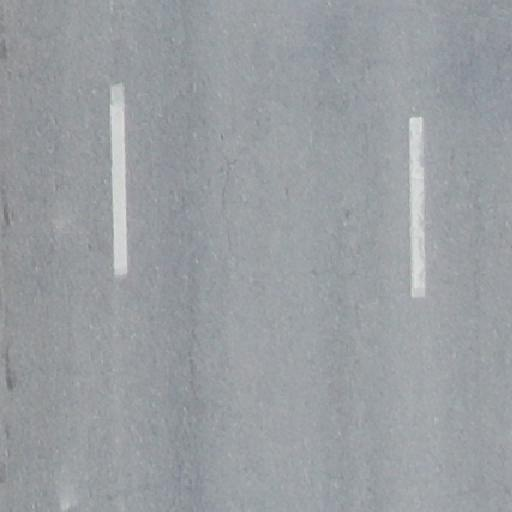

Japan_008730.png


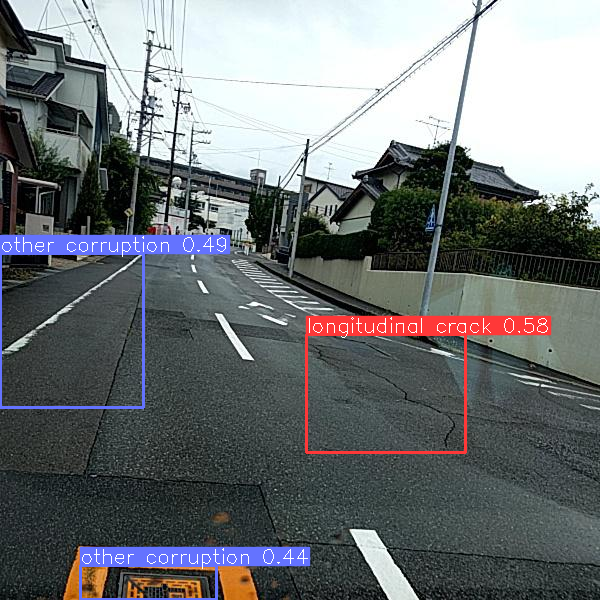

Norway_002697.png


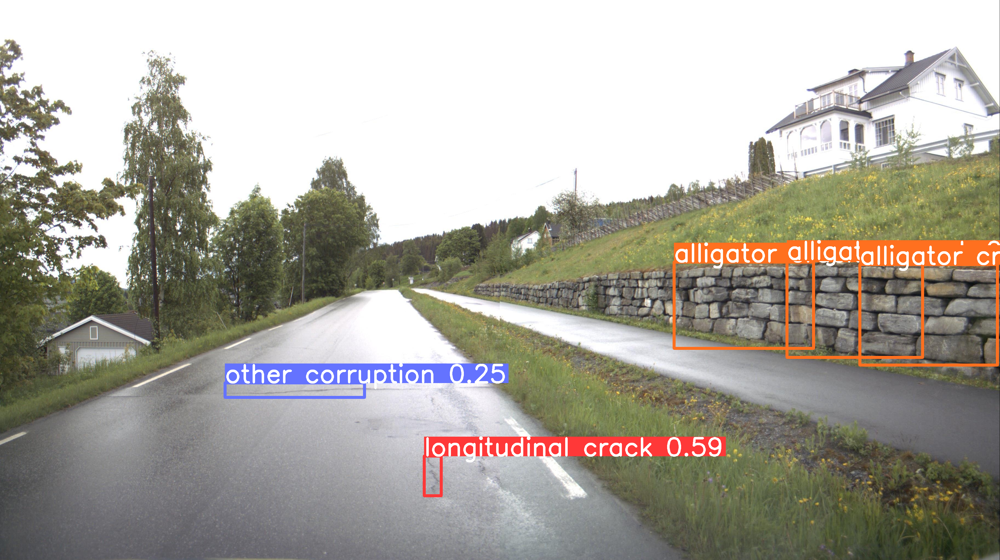

United_States_004588.png


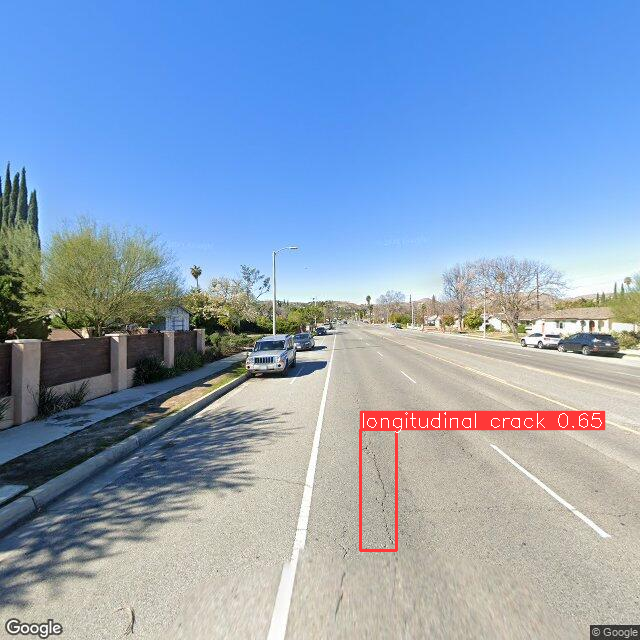

United_States_004653.png


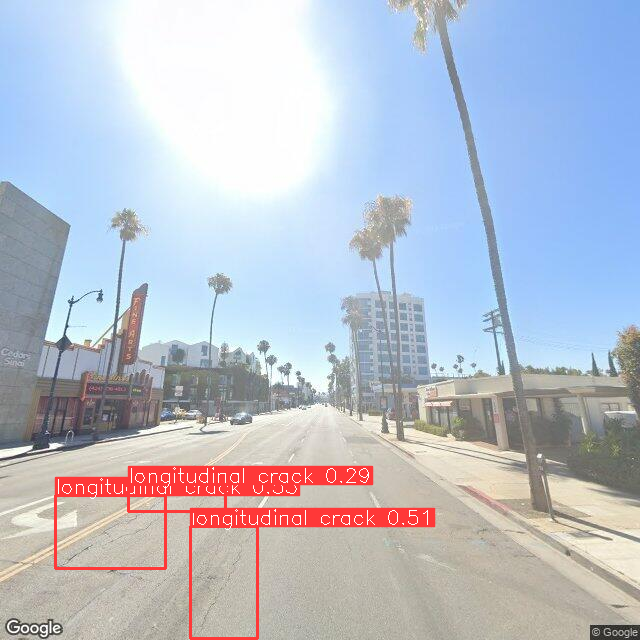

In [12]:
from PIL import Image
from IPython.display import display

for img in sorted(os.listdir("thesis_examples")):
    print(img)
    display(Image.open(os.path.join("thesis_examples", img)))

In [13]:
candidate_images = []

evaluation_subset = random.sample(
    labeled_images,
    300
)

for image_name in evaluation_subset:

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    yolo_count = len(
        model(
            image_path,
            verbose=False
        )[0].boxes
    )

    sahi_count = len(
        get_sliced_prediction(
            image_path,
            detection_model,
            slice_height=512,
            slice_width=512,
            overlap_height_ratio=0.2,
            overlap_width_ratio=0.2
        ).object_prediction_list
    )

    gain = sahi_count - yolo_count

    candidate_images.append({
        "image_path": image_path,
        "yolo": yolo_count,
        "sahi": sahi_count,
        "gain": gain
    })

candidate_images = sorted(
    candidate_images,
    key=lambda x: x["gain"],
    reverse=True
)

candidate_images[:10]

Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 45 slices.
Performing prediction on 4 slices.
Performing prediction on 9 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 50 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 45 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing predic

[{'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Norway_004628.jpg',
  'yolo': 1,
  'sahi': 8,
  'gain': 7},
 {'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Norway_006660.jpg',
  'yolo': 3,
  'sahi': 9,
  'gain': 6},
 {'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Japan_010219.jpg',
  'yolo': 1,
  'sahi': 5,
  'gain': 4},
 {'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Norway_005400.jpg',
  'yolo': 0,
  'sahi': 4,
  'gain': 4},
 {'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Norway_005798.jpg',
  'yolo': 6,
  'sahi': 10,
  'gain': 4},
 {'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Norway_006895.jpg',
  'yolo': 0,
  'sahi': 4,
  'gain': 4},
 {'image_path': '/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images/Norway_004928.jpg',
  'yolo': 1,
  'sahi': 5,
  'gai

In [14]:
import os
import shutil

shutil.rmtree(
    "top_gain_comparisons",
    ignore_errors=True
)

os.makedirs(
    "top_gain_comparisons",
    exist_ok=True
)

print("Folder ready")

Folder ready


In [15]:
top_images = candidate_images[:5]

for idx, item in enumerate(
    top_images,
    start=1
):

    image_path = item["image_path"]

    yolo_result = model(
        image_path,
        verbose=False
    )[0]

    yolo_img = yolo_result.plot()

    sahi_result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=512,
        slice_width=512,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2
    )

    original = cv2.imread(
        image_path
    )

    original = cv2.cvtColor(
        original,
        cv2.COLOR_BGR2RGB
    )

    vis = visualize_object_predictions(
        image=original,
        object_prediction_list=sahi_result.object_prediction_list,
        output_dir=None
    )

    sahi_img = vis["image"]

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(12,6)
    )

    axes[0].imshow(
        cv2.cvtColor(
            yolo_img,
            cv2.COLOR_BGR2RGB
        )
    )

    axes[0].set_title(
        f"YOLO ({item['yolo']})"
    )

    axes[0].axis("off")

    axes[1].imshow(
        sahi_img
    )

    axes[1].set_title(
        f"SAHI ({item['sahi']})"
    )

    axes[1].axis("off")

    plt.tight_layout()

    plt.savefig(
        f"top_gain_comparisons/top_gain_{idx}.png",
        dpi=300
    )

    plt.close()

Performing prediction on 45 slices.
Performing prediction on 45 slices.
Performing prediction on 9 slices.
Performing prediction on 50 slices.
Performing prediction on 45 slices.


In [16]:
for idx, item in enumerate(top_images, start=1):

    print(
        f"{idx}.",
        os.path.basename(item['image_path']),
        f"YOLO={item['yolo']}",
        f"SAHI={item['sahi']}",
        f"Gain={item['gain']}"
    )

1. Norway_004628.jpg YOLO=1 SAHI=8 Gain=7
2. Norway_006660.jpg YOLO=3 SAHI=9 Gain=6
3. Japan_010219.jpg YOLO=1 SAHI=5 Gain=4
4. Norway_005400.jpg YOLO=0 SAHI=4 Gain=4
5. Norway_005798.jpg YOLO=6 SAHI=10 Gain=4


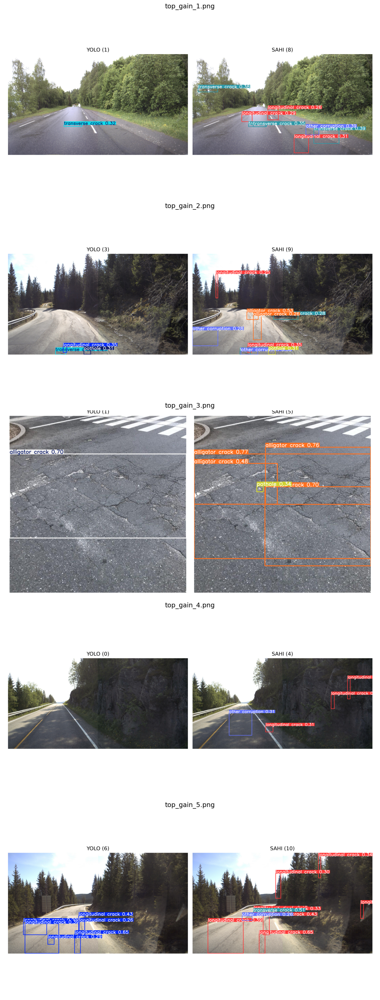

In [17]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

comparison_files = sorted(
    os.listdir("top_gain_comparisons")
)

fig, axes = plt.subplots(
    len(comparison_files),
    1,
    figsize=(14, 6 * len(comparison_files))
)

if len(comparison_files) == 1:
    axes = [axes]

for ax, file in zip(axes, comparison_files):

    img = mpimg.imread(
        os.path.join(
            "top_gain_comparisons",
            file
        )
    )

    ax.imshow(img)
    ax.set_title(file, fontsize=14)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [18]:
subset_images = random.sample(
    labeled_images,
    2000
)

total_yolo = 0
total_sahi = 0

for image_name in subset_images:

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    total_yolo += len(
        model(
            image_path,
            verbose=False
        )[0].boxes
    )

    total_sahi += len(
        get_sliced_prediction(
            image_path,
            detection_model,
            slice_height=512,
            slice_width=512,
            overlap_height_ratio=0.2,
            overlap_width_ratio=0.2
        ).object_prediction_list
    )

improvement = (
    (total_sahi - total_yolo)
    / total_yolo
) * 100

print("YOLOv11m detections:", total_yolo)
print("SAHI detections:", total_sahi)
print(f"Improvement: {improvement:.2f}%")

Performing prediction on 4 slices.
Performing prediction on 45 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing prediction on 4 slices.
Performing prediction on 45 slices.
Performing prediction on 4 slices.
Performing prediction on 1 slices.
Performing prediction on 4 slices.
Performing predict

In [19]:
with open("evaluation_summary.txt", "w") as f:
    f.write("Model: YOLOv11m + SAHI\n\n")
    f.write("Images Evaluated: 2000\n\n")
    f.write(f"YOLO11m Detections: {total_yolo}\n")
    f.write(f"SAHI Detections: {total_sahi}\n")
    f.write(f"Improvement (%): {improvement:.2f}\n")

In [22]:
!zip -r yolov11m_sahi_results.zip \
    thesis_examples \
    top_gain_comparisons \
    evaluation_summary.txt

  adding: thesis_examples/ (stored 0%)
  adding: thesis_examples/United_States_004653.png (deflated 7%)
  adding: thesis_examples/Norway_002697.png (deflated 4%)
  adding: thesis_examples/United_States_004588.png (deflated 6%)
  adding: thesis_examples/China_Drone_000905.png (deflated 18%)
  adding: thesis_examples/Japan_008730.png (deflated 8%)
  adding: top_gain_comparisons/ (stored 0%)
  adding: top_gain_comparisons/top_gain_2.png (deflated 2%)
  adding: top_gain_comparisons/top_gain_1.png (deflated 2%)
  adding: top_gain_comparisons/top_gain_3.png (deflated 2%)
  adding: top_gain_comparisons/top_gain_5.png (deflated 2%)
  adding: top_gain_comparisons/top_gain_4.png (deflated 2%)
  adding: evaluation_summary.txt (deflated 14%)


In [7]:
SAHI_PRED_DIR = "/kaggle/working/sahi_predictions"

if os.path.exists(SAHI_PRED_DIR):
    shutil.rmtree(SAHI_PRED_DIR)

os.makedirs(
    os.path.join(SAHI_PRED_DIR, "labels"),
    exist_ok=True
)

print("Prediction directory ready.")

Prediction directory ready.


In [8]:
import os
import json
from PIL import Image

COCO_GT_PATH = "/kaggle/working/instances_val.json"

categories = [
    {"id": 1, "name": "Longitudinal Crack"},
    {"id": 2, "name": "Transverse Crack"},
    {"id": 3, "name": "Alligator Crack"},
    {"id": 4, "name": "Other Corruption"},
    {"id": 5, "name": "Pothole"},
]

# ALL validation images (including backgrounds)
all_images = sorted([
    f for f in os.listdir(VAL_IMAGES)
    if f.endswith(".jpg")
])

images = []
annotations = []

annotation_id = 1

for image_name in all_images:

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    label_path = os.path.join(
        LABEL_DIR,
        image_name.replace(".jpg", ".txt")
    )

    width, height = Image.open(image_path).size

    image_id = image_name.replace(".jpg", "")

    images.append({
        "id": image_id,
        "file_name": image_name,
        "width": width,
        "height": height
    })

    if not os.path.exists(label_path):
        continue

    with open(label_path) as f:

        for line in f:

            cls, xc, yc, bw, bh = map(float, line.split())

            x = (xc - bw / 2) * width
            y = (yc - bh / 2) * height
            w = bw * width
            h = bh * height

            annotations.append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": int(cls) + 1,
                "bbox": [x, y, w, h],
                "area": w * h,
                "iscrowd": 0
            })

            annotation_id += 1

coco_gt = {
    "images": images,
    "annotations": annotations,
    "categories": categories
}

with open(COCO_GT_PATH, "w") as f:
    json.dump(coco_gt, f)

print("Saved:", COCO_GT_PATH)
print("Images:", len(images))
print("Annotations:", len(annotations))

Saved: /kaggle/working/instances_val.json
Images: 5758
Annotations: 9741


In [11]:
import json
from tqdm import tqdm
from sahi.predict import get_sliced_prediction

COCO_PRED_PATH = "/kaggle/working/predictions.json"

predictions = []

for image_name in tqdm(all_images):

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=512,
        slice_width=512,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2,
        verbose=0
    )

    image_id = image_name.replace(".jpg", "")

    for pred in result.object_prediction_list:

        x, y, w, h = pred.bbox.to_xywh()

        predictions.append({

            "image_id": image_id,

            "category_id": int(pred.category.id) + 1,

            "bbox": [
                float(x),
                float(y),
                float(w),
                float(h)
            ],

            "score": float(pred.score.value)

        })

with open(COCO_PRED_PATH, "w") as f:
    json.dump(predictions, f)

print(f"Saved predictions to {COCO_PRED_PATH}")
print(f"Total predictions: {len(predictions)}")

100%|██████████| 5758/5758 [43:03<00:00,  2.23it/s]


Saved predictions to /kaggle/working/predictions.json
Total predictions: 11354


In [13]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

coco_gt = COCO(COCO_GT_PATH)

coco_dt = coco_gt.loadRes(COCO_PRED_PATH)

coco_eval = COCOeval(
    coco_gt,
    coco_dt,
    iouType="bbox"
)

coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.76s).
Accumulating evaluation results...
DONE (t=0.50s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.412
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.176
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.135
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.178
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.211
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.230
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.301
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

In [14]:
import pandas as pd

summary = {
    "Precision": coco_eval.stats[1],   # AP@50
    "Recall": coco_eval.stats[8],      # AR@100
    "mAP50": coco_eval.stats[1],
    "mAP50_95": coco_eval.stats[0]
}

df = pd.DataFrame([summary])

df.to_csv("sahi_metrics.csv", index=False)

display(df)

,Precision,Recall,mAP50,mAP50_95
0,0.412138,0.301117,0.412138,0.202615


In [9]:
detection_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=MODEL_PATH,
    confidence_threshold=0.50,
    device="cuda"
)

model = YOLO(MODEL_PATH)

In [10]:
import json
from tqdm import tqdm
from sahi.predict import get_sliced_prediction

COCO_PRED_PATH = "/kaggle/working/predictions.json"

predictions = []

for image_name in tqdm(all_images):

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=512,
        slice_width=512,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2,
        verbose=0
    )

    image_id = image_name.replace(".jpg", "")

    for pred in result.object_prediction_list:

        x, y, w, h = pred.bbox.to_xywh()

        predictions.append({

            "image_id": image_id,

            "category_id": int(pred.category.id) + 1,

            "bbox": [
                float(x),
                float(y),
                float(w),
                float(h)
            ],

            "score": float(pred.score.value)

        })

with open(COCO_PRED_PATH, "w") as f:
    json.dump(predictions, f)

print(f"Saved predictions to {COCO_PRED_PATH}")
print(f"Total predictions: {len(predictions)}")

100%|██████████| 5758/5758 [42:39<00:00,  2.25it/s]

Saved predictions to /kaggle/working/predictions.json
Total predictions: 4506


In [14]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
coco_gt = COCO(COCO_GT_PATH)
coco_dt = coco_gt.loadRes(COCO_PRED_PATH)

coco_eval = COCOeval(
    coco_gt,
    coco_dt,
    "bbox"
)

coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.67s).
Accumulating evaluation results...
DONE (t=0.32s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.171
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.307
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.168
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.097
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.135
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.190
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.183
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.218
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

In [15]:
detection_model = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=MODEL_PATH,
    confidence_threshold=0.25,
    device="cuda"
)

model = YOLO(MODEL_PATH)

In [17]:
import json
from tqdm import tqdm
from sahi.predict import get_sliced_prediction

COCO_PRED_PATH = "/kaggle/working/predictions.json"

predictions = []

for image_name in tqdm(all_images):

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=640,
        slice_width=640,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2,
        verbose=0
    )

    image_id = image_name.replace(".jpg", "")

    for pred in result.object_prediction_list:

        x, y, w, h = pred.bbox.to_xywh()

        predictions.append({

            "image_id": image_id,

            "category_id": int(pred.category.id) + 1,

            "bbox": [
                float(x),
                float(y),
                float(w),
                float(h)
            ],

            "score": float(pred.score.value)

        })

with open(COCO_PRED_PATH, "w") as f:
    json.dump(predictions, f)

print(f"Saved predictions to {COCO_PRED_PATH}")
print(f"Total predictions: {len(predictions)}")

100%|██████████| 5758/5758 [28:08<00:00,  3.41it/s]


Saved predictions to /kaggle/working/predictions.json
Total predictions: 9059


In [20]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
coco_gt = COCO(COCO_GT_PATH)
coco_dt = coco_gt.loadRes(COCO_PRED_PATH)

coco_eval = COCOeval(
    coco_gt,
    coco_dt,
    "bbox"
)

coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()


loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.31s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.37s).
Accumulating evaluation results...
DONE (t=0.48s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.208
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.192
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.125
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.180
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.223
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.234
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.299
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets